# **Telecom Churn Case Study**
(submission by Uday Kumar Adavi)

### Problem Statement:

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, we will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn.

In this competition, our goal is to build a machine learning model that is able to predict churning customers based on the features provided for their usage.

### Objectives:

The main goal of the case study is to build ML models to predict churn. The predictive model that you’re going to build will the following purposes:

- It will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

- It will be used to identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.

- Even though overall accuracy will be your primary evaluation metric, you should also mention other metrics like precision, recall, etc. for the different models that can be used for evaluation purposes based on different business objectives. For example, in this problem statement, one business goal can be to build an ML model that identifies customers who'll definitely with more accuracy as compared to the ones who'll not churn. Make sure you mention which metric can be used in such scenarios.

- Recommend strategies to manage customer churn based on your observations.

### Methodology:
We will break down our approach into the below steps:

- Data gathering, understanding, handling & cleaning
- Exploratory Analysis
- Data preparatation for modelling
- Model building (& validation) for best performance (multiple iterations using different techniques)
- Model interpreations & insights
- Final results

Each of these have sub-steps that complete all the necessary activities to be done to arrive at a robust analysis & model

## Libraries & Environment

In [105]:
#import libraries needed
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter

import sklearn
from sklearn.preprocessing import MinMaxScaler, StandardScaler, PolynomialFeatures
from sklearn.feature_selection import RFE, RFECV
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn import metrics 

import xgboost as xgb 

from imblearn.over_sampling import SMOTE
from imblearn.combine import SMOTETomek
from imblearn.combine import SMOTEENN

import shap
import lime
from lime import lime_tabular

import warnings

#settings
warnings.filterwarnings('ignore')
sns.set_style("darkgrid")
plt.style.use("tableau-colorblind10")

#setting one value for repeatability of samples
random_state = 100

# Data gathering, understanding, handling & cleaning:

### Data gather and inspection

In [2]:
# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [3]:
#read file from the csvs (either on local or kaggle input folder

#from kaggle input folder
# traincsv_df = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-gc1/train.csv")
# testcsv_df = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-gc1/test.csv")
# datadictcsv_df = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-gc1/data_dictionary.csv")
# samplecsv_df = pd.read_csv("/kaggle/input/telecom-churn-case-study-hackathon-gc1/sample.csv")

#from csvs on local
traincsv_df = pd.read_csv("train.csv")
testcsv_df = pd.read_csv("test.csv")
datadictcsv_df = pd.read_csv("data_dictionary.csv")
samplecsv_df = pd.read_csv("sample.csv")

#check
print(traincsv_df.shape)
print(testcsv_df.shape)
print(datadictcsv_df.shape)
print(samplecsv_df.shape)

(69999, 172)
(30000, 171)
(36, 2)
(30000, 2)


In [4]:
#check for duplicates
traincsv_df.drop_duplicates(inplace=True)
print(traincsv_df.shape)
testcsv_df.drop_duplicates(inplace=True)
print(testcsv_df.shape)


(69999, 172)
(30000, 171)


There are no duplicates in both the files above as the shape is the same before and after dropping duplicates

In [5]:
#check sample rows of data in traincsv - inspecting the data
pd.set_option('display.max_columns', None)
traincsv_df.head(15)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.00,0.00,0.00,0.00,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.00,0.00,0.00,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.00,0.0,0.66,0.00,0.00,0.00,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.00,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.00,0.00,0.00,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.00,0.0,0.01,0.00,0.00,0.00,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN

In [6]:
#inspecting the values aggreated to better understand
traincsv_df.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000

In [7]:
#check sample rows of data in testcsv
testcsv_df.head(5)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/2014,250,0,0,NaN,NaN,Na

In [8]:
#check columns of traincsv
traincsv_df.info(verbose = True, show_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Non-Null Count  Dtype  
---   ------                    --------------  -----  
 0    id                        69999 non-null  int64  
 1    circle_id                 69999 non-null  int64  
 2    loc_og_t2o_mou            69297 non-null  float64
 3    std_og_t2o_mou            69297 non-null  float64
 4    loc_ic_t2o_mou            69297 non-null  float64
 5    last_date_of_month_6      69999 non-null  object 
 6    last_date_of_month_7      69600 non-null  object 
 7    last_date_of_month_8      69266 non-null  object 
 8    arpu_6                    69999 non-null  float64
 9    arpu_7                    69999 non-null  float64
 10   arpu_8                    69999 non-null  float64
 11   onnet_mou_6               67231 non-null  float64
 12   onnet_mou_7               67312 non-null  float64
 13   onnet_mou_8               66296 non-null  fl

#### quick learnings:
Most of the columns seem to be numeric. They are either, minutes of usage or revenue or amounts or quantity or datausage or a binary flag.<br>
Any manipulations we do, we will need to do it on the testcsvdf as well because we need to eventually predict on this file

### Fixing formats and standardising

Data colums have been tagged as 'category'

In [9]:
# all date columns
datecols = [c for c in traincsv_df.columns if 'date' in c]

#convert to datetime format
traincsv_df[datecols] = traincsv_df[datecols].apply(pd.to_datetime)
testcsv_df[datecols] = testcsv_df[datecols].apply(pd.to_datetime)

#check
datecols

['last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8']

#### Derived variables using date columns

In [10]:
# create new DATE RELATED COLUMNS - differences
traincsv_df['datediff_of_last_rech_6'] = (traincsv_df['last_date_of_month_6'] - traincsv_df['date_of_last_rech_6'])/(dt.timedelta(days=1))
traincsv_df['datediff_of_last_rech_7'] = (traincsv_df['last_date_of_month_7'] - traincsv_df['date_of_last_rech_7'])/(dt.timedelta(days=1))
traincsv_df['datediff_of_last_rech_8'] = (traincsv_df['last_date_of_month_8'] - traincsv_df['date_of_last_rech_8'])/(dt.timedelta(days=1))

traincsv_df['datediff_of_last_rech_data_6'] = (traincsv_df['last_date_of_month_6'] - traincsv_df['date_of_last_rech_data_6'])/(dt.timedelta(days=1))
traincsv_df['datediff_of_last_rech_data_7'] = (traincsv_df['last_date_of_month_7'] - traincsv_df['date_of_last_rech_data_7'])/(dt.timedelta(days=1))
traincsv_df['datediff_of_last_rech_data_8'] = (traincsv_df['last_date_of_month_8'] - traincsv_df['date_of_last_rech_data_8'])/(dt.timedelta(days=1))

testcsv_df['datediff_of_last_rech_6'] = (testcsv_df['last_date_of_month_6'] - testcsv_df['date_of_last_rech_6'])/(dt.timedelta(days=1))
testcsv_df['datediff_of_last_rech_7'] = (testcsv_df['last_date_of_month_7'] - testcsv_df['date_of_last_rech_7'])/(dt.timedelta(days=1))
testcsv_df['datediff_of_last_rech_8'] = (testcsv_df['last_date_of_month_8'] - testcsv_df['date_of_last_rech_8'])/(dt.timedelta(days=1))

testcsv_df['datediff_of_last_rech_data_6'] = (testcsv_df['last_date_of_month_6'] - testcsv_df['date_of_last_rech_data_6'])/(dt.timedelta(days=1))
testcsv_df['datediff_of_last_rech_data_7'] = (testcsv_df['last_date_of_month_7'] - testcsv_df['date_of_last_rech_data_7'])/(dt.timedelta(days=1))
testcsv_df['datediff_of_last_rech_data_8'] = (testcsv_df['last_date_of_month_8'] - testcsv_df['date_of_last_rech_data_8'])/(dt.timedelta(days=1))


In [11]:
### categorical columns
traincsv_df['churn_probability'] = traincsv_df['churn_probability'].astype('category')

# traincsv_df['fb_user_6'] = traincsv_df['fb_user_6'].astype('category')
# traincsv_df['fb_user_7'] = traincsv_df['fb_user_7'].astype('category')
# traincsv_df['fb_user_8'] = traincsv_df['fb_user_8'].astype('category')
# traincsv_df['night_pck_user_6'] = traincsv_df['night_pck_user_6'].astype('category')
# traincsv_df['night_pck_user_7'] = traincsv_df['night_pck_user_7'].astype('category')
# traincsv_df['night_pck_user_8'] = traincsv_df['night_pck_user_8'].astype('category')
# testcsv_df['fb_user_6'] = testcsv_df['fb_user_6'].astype('category')
# testcsv_df['fb_user_7'] = testcsv_df['fb_user_7'].astype('category')
# testcsv_df['fb_user_8'] = testcsv_df['fb_user_8'].astype('category')
# testcsv_df['night_pck_user_6'] = testcsv_df['night_pck_user_6'].astype('category')
# testcsv_df['night_pck_user_7'] = testcsv_df['night_pck_user_7'].astype('category')
# testcsv_df['night_pck_user_8'] = testcsv_df['night_pck_user_8'].astype('category')

Note: There are some columns(commented in the above cell) that are binary flags. It is ok to keep them as is and no need to convert to category

### Cleaning 

#### columns with only one value

In [12]:
#checking if there are any columns which have only one value
cols_uniqvals = traincsv_df.nunique()
traincsv_df[cols_uniqvals[cols_uniqvals==1].index].head()

,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8
0,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0,0.0
1,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0,0.0
2,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0,0.0
3,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0,0.0
4,109,0.0,0.0,0.0,2014-06-30,2014-07-31,2014-08-31,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
#store
unq1 = cols_uniqvals[cols_uniqvals==1].index.to_list()

In [14]:
#keeping a copy for later purpose
testcsv_df_id = pd.DataFrame(testcsv_df['id'], columns =['id'])

In [15]:
#drop columns
cols_drop = unq1 + datecols
cols_drop.append('id')

#removing columns
traincsv_df.drop(columns = cols_drop, inplace = True)

#removing columns
testcsv_df.drop(columns = cols_drop, inplace = True)

In [16]:
#check columns of traincsv
traincsv_df.info(verbose = True, show_counts = True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 69999 entries, 0 to 69998
Data columns (total 158 columns):
 #    Column                        Non-Null Count  Dtype   
---   ------                        --------------  -----   
 0    arpu_6                        69999 non-null  float64 
 1    arpu_7                        69999 non-null  float64 
 2    arpu_8                        69999 non-null  float64 
 3    onnet_mou_6                   67231 non-null  float64 
 4    onnet_mou_7                   67312 non-null  float64 
 5    onnet_mou_8                   66296 non-null  float64 
 6    offnet_mou_6                  67231 non-null  float64 
 7    offnet_mou_7                  67312 non-null  float64 
 8    offnet_mou_8                  66296 non-null  float64 
 9    roam_ic_mou_6                 67231 non-null  float64 
 10   roam_ic_mou_7                 67312 non-null  float64 
 11   roam_ic_mou_8                 66296 non-null  float64 
 12   roam_og_mou_6                 

### Missing values

As we noted earlier,  the type of columns with all of them being numeric, upon closer inspection in the rows/columns above of the dataframe as well as seeing the describe function, we can come to the conclusion that, where there is a missing value, it is actually just meant to be'Zero'(whether it was minutes ofusage, MBs of data, revenue, amounts, quantity,etc.)
Hence the correct(and simplest) form of doing missing value treatment here is just replacing with 'zero' for all the columns. 

In [17]:
#check %nas
cols_na = (traincsv_df.isnull().mean(axis=0)*100).round(5).sort_values(ascending =False)
cols_na = cols_na[cols_na.values>0]
print(cols_na)

count_rech_3g_6            74.90250
night_pck_user_6           74.90250
fb_user_6                  74.90250
total_rech_data_6          74.90250
arpu_2g_6                  74.90250
                             ...   
std_og_t2m_mou_7            3.83863
loc_ic_t2t_mou_7            3.83863
datediff_of_last_rech_8     3.51576
datediff_of_last_rech_7     1.76288
datediff_of_last_rech_6     1.57288
Length: 114, dtype: float64


In [18]:
#replacing with zero
for c in cols_na.index:
    traincsv_df[c] = traincsv_df[c].fillna(0)    
    testcsv_df[c] = testcsv_df[c].fillna(0)        

In [19]:
#check
cols_na = (traincsv_df.isnull().mean(axis=0)*100).round(5).sort_values(ascending =False)
cols_na = cols_na[cols_na.values>0]
print(cols_na)

Series([], dtype: float64)


In [20]:
#check
cols_na = (testcsv_df.isnull().mean(axis=0)*100).round(5).sort_values(ascending =False)
cols_na = cols_na[cols_na.values>0]
print(cols_na)

Series([], dtype: float64)


All missing values have been handled

## Exploratory Data Analysis :

In [21]:
#quick look at all relevant percentiles to understand distributions
traincsv_df.describe(percentiles=[0,0.01,0.05,0.1,0.25,0.5,0.75,0.9,0.95,0.99]).round(4)

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,datediff_of_last_rech_6,datediff_of_last_rech_7,datediff_of_last_rech_8,datediff_of_last_rech_data_6,datediff_of_last_rech_data_7,datediff_of_last_rech_data_8
count,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.0000,69999.00

Below are the binary flags columns that indicate presence/absence of feature

In [22]:
binary_cols = ['fb_user_6','fb_user_7','fb_user_8','night_pck_user_6','night_pck_user_7','night_pck_user_8','churn_probability']

In [23]:
# function for custom visuals to analyse numeric variables
def plot_num(df, var, target = 'churn_probability', figsize = (30,5)):
        
    fig, ax = plt.subplots(1,3, figsize = figsize)
    
    sns.distplot(ax = ax[0], x = df[var])
    ax[0].set_title(("Distribution of " + var), fontsize=20)
    ax[0].set_ylabel("Density", fontsize=20)
    ax[0].set_xlabel(var, fontsize=20)
    ax[0].set_yticklabels(ax[0].get_yticks(), size = 18)
    ax[0].set_xticklabels(ax[0].get_xticks(), size = 11)
    
    sns.boxplot(ax = ax[1], x = df[var])
    ax[1].set_title(("Boxplot for " + var), fontsize=20)    
    ax[1].set_ylabel(var, fontsize=20)    
    ax[1].set_yticklabels(ax[1].get_yticks(), size = 11)
    
    sns.barplot(ax = ax[2], y = df[var], x = df[target])
    ax[2].set_title(("Bivariate - Churn Vs.  " + var), fontsize=20)    
    ax[2].set_ylabel(var, fontsize=20)    
    ax[2].set_yticklabels(ax[2].get_yticks(), size = 11)
    
    plt.show()

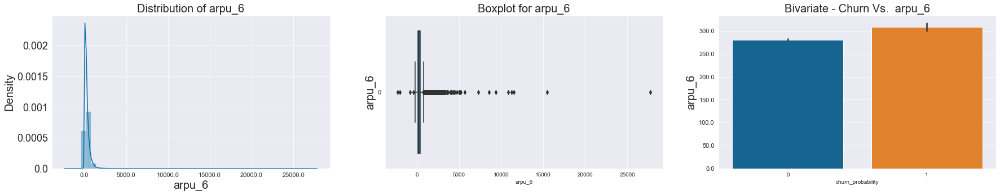

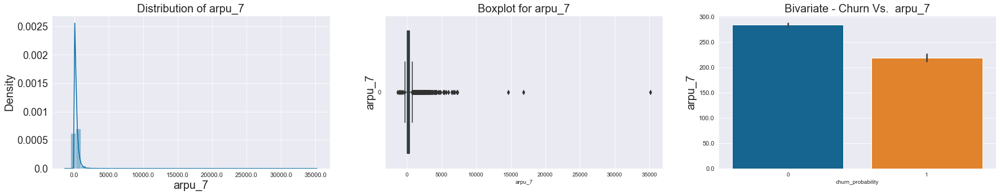

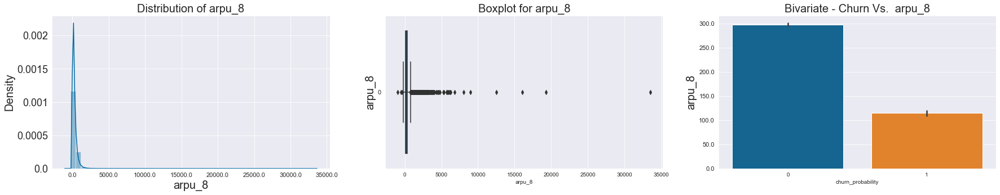

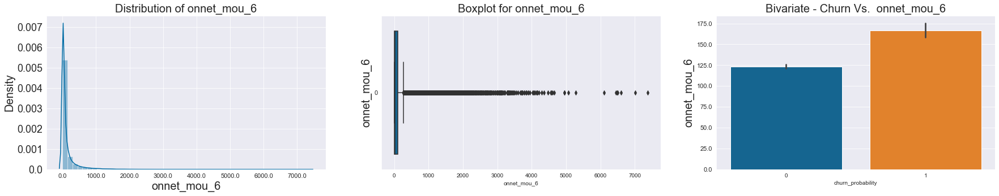

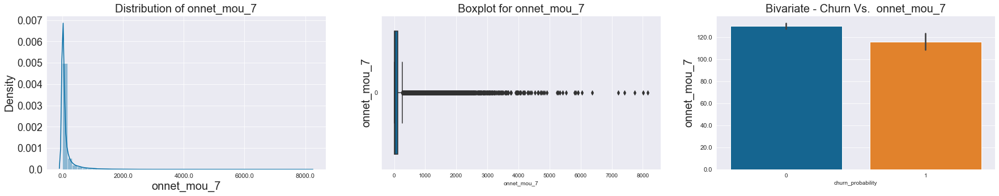

...

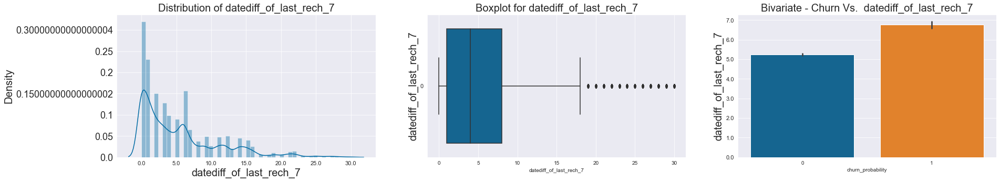

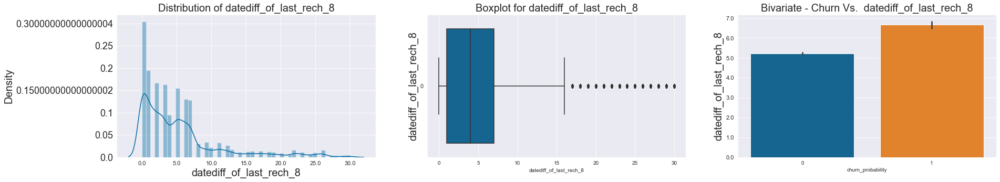

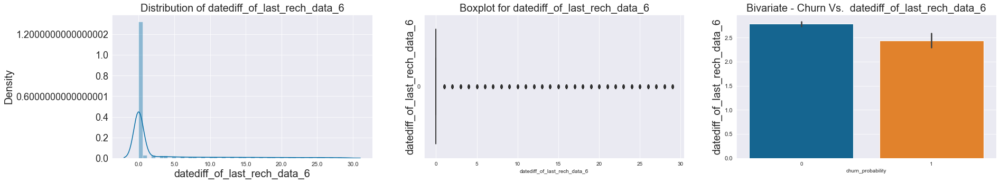

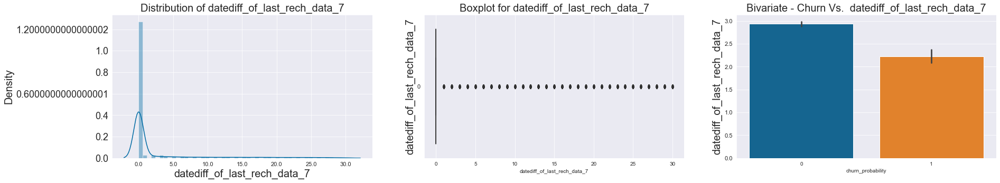

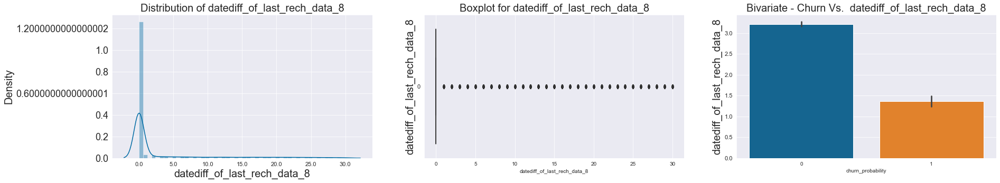

In [26]:
for var in traincsv_df.columns:
    if var not in binary_cols:
        plot_num(traincsv_df,var)

### Learning from this exploration exercise

Since there are several variables, we are not going to talk about one-by-one, but mention high level learnings that can help us with our eventual goal of coming up with the best performing model and also making interpretations
- There are some negative values for arpu columns. these may not be errors, these might have some meaning. Not treating them
- The right most chart, the barplot, shows variation between Churn and non churn across each of the variables
- Majority of the variables have a decent pattern with the difference in mean between churn and non churn group
- There are some columns that are a total of few other columns. This is duly noted and acknowledged. There is some repetitive pattern shown by few columns
- Keeping both the above observations, we will keep all the variables, noting there is some linear relationships. We will be aiming to use models based on trees like Random forest and xgboost which will have lesser effect due to this. Models like logsitc regression or SVM liner kernel are boound to be impacted by the redundant features
- Amost all of the variables have outliers on the boxplot. While this is not really an alarming situation as the values are not any ridiculaous numbers

### Correlations

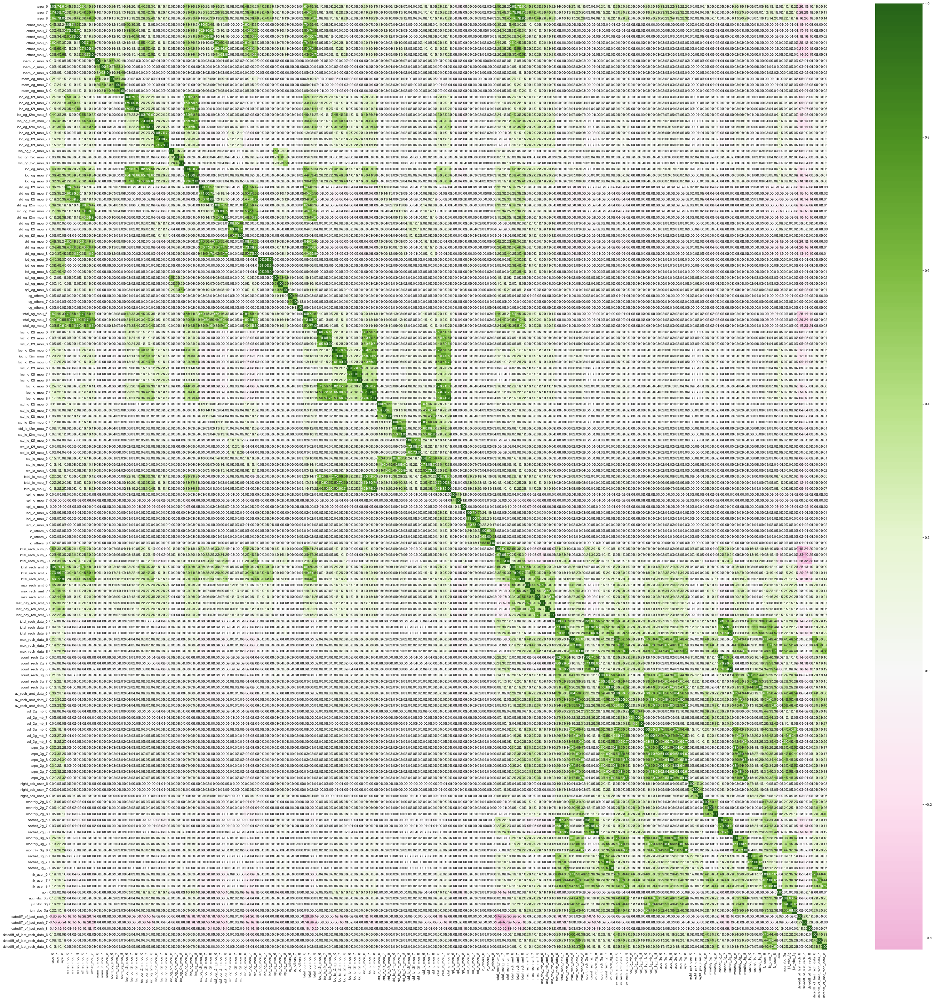

Wall time: 1min 36s


In [25]:
%%time
#plot correlation heatmap 
dcorr = traincsv_df.corr()
plt.figure(figsize = (50,50))
sns.heatmap(dcorr, annot=True, fmt = '.2f', cmap = 'PiYG',center = 0)
plt.show()

#### Learnings from correlation plot:
as expected there are pockets of highly correlated variables. We know these are the columns that are totals of other columns. Using non linear models, we will not have issue because of them

### Derived variables/transformations

Appropriate variables have been created in prior steps where relevant.<br>
Log transformation was cosnsidered for variables as there was skew in the distribution. There are several columns that have negative values in it and also we are intending to use non linear models primarily. Hence the transformation has been dropped

Transforming the skewed distribution of 'aon'

In [26]:
traincsv_df['aon']=np.log(traincsv_df['aon']+1)
testcsv_df['aon']=np.log(testcsv_df['aon']+1)

### Outliers

Give there are outliers everywhere, we will using a blanket approach of the IQR method to cap outliers

In [27]:
#function using iqr method for outliers detection and then capping 
def outlier_treat_capping(df,var):
    q1 = df[var].quantile(0.25)
    q3 = df[var].quantile(0.75)
    iqr = q3-q1
    l = q1 - 1.5*iqr #mild treatment. using 2 instead of 1.5
    u = q3 + 1.5*iqr
    df[var] = np.where((df[var] < l),l,np.where((df[var]>u),u,df[var]))

In [28]:
#treatment for all columns
for var in traincsv_df.columns:
    if var not in binary_cols:
        outlier_treat_capping(traincsv_df,var)

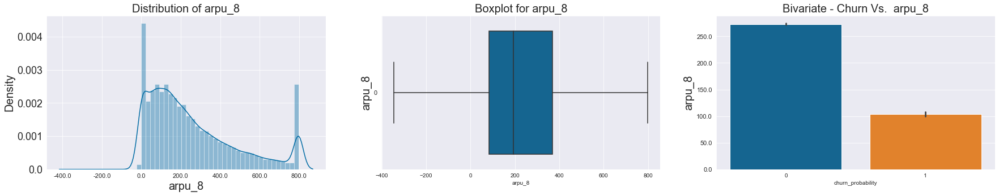

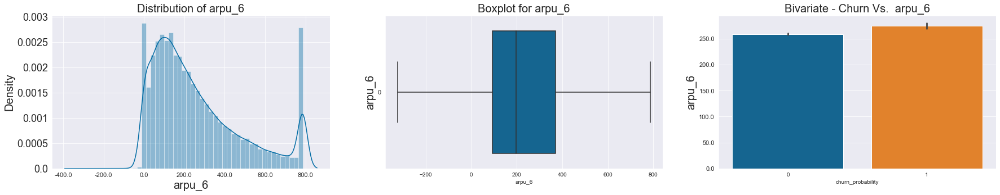

In [29]:
#checking few columns post outlier treatment
var = 'arpu_8'
plot_num(traincsv_df,var)

var = 'arpu_6'
plot_num(traincsv_df,var)

## Data prep for modelling
### Dummy variables

In [30]:
df_obj_cols = traincsv_df.select_dtypes(include = ['object','category']).columns
df_num_cols = traincsv_df.select_dtypes(include = ['int64', 'float64']).columns
print(len(df_obj_cols))
print(len(df_num_cols))

1
157


In [31]:
# NO CATEG VARIABLES to create DUMMYs- few binary columns have ben left as is

### X&y

In [32]:
#create X & y
y = traincsv_df.pop('churn_probability')
X = traincsv_df

### Split into test and train

In [33]:
#use train train_test_split to create 70-30 split
X_train,X_test, y_train, y_test = train_test_split(X,y, train_size = 0.7, random_state = random_state)

#check
print(y_train.shape)
print(X_train.shape)
print(y_test.shape)
print(X_test.shape)

(48999,)
(48999, 157)
(21000,)
(21000, 157)


### Scaling

In [34]:
# using sklearn Standard scaler

#instance
scaler = StandardScaler()

#fit and transform on the train numeric columns
X_train[df_num_cols] = scaler.fit_transform(X_train[df_num_cols])

#transform the test using the same scaler that was fit on the train
X_test[df_num_cols] = scaler.transform(X_test[df_num_cols])

#transform the submission test using the same scaler that was fit on the train
testcsv_df[df_num_cols] = scaler.transform(testcsv_df[df_num_cols])

### PCA(for dimensionality reduction)

In [35]:
pca = PCA(random_state=random_state)
#pca = PCA(0.95)
pca.fit(X_train)

PCA(random_state=100)

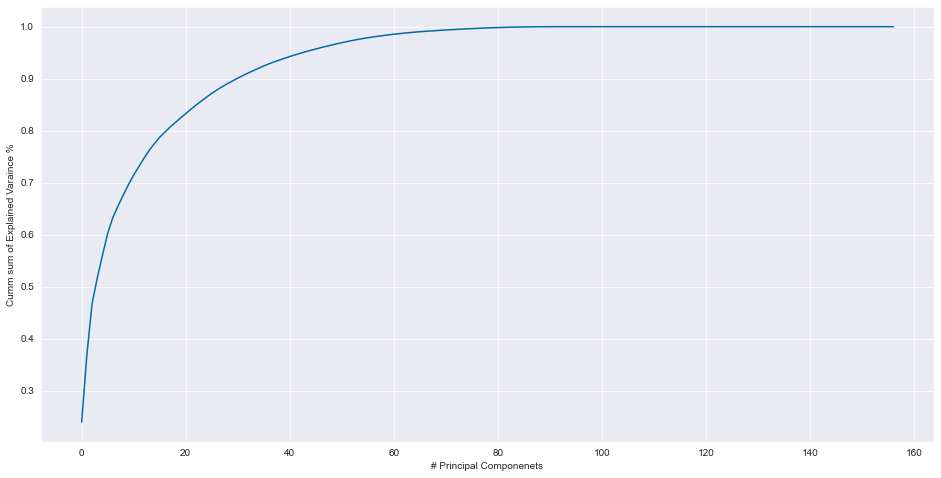

In [36]:
#plot explained varaince ratio
fig = plt.figure(figsize = (16,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('# Principal Componenets')
plt.ylabel('Cumm sum of Explained Varaince %')
plt.show()

We get 95% variance coverage for 45 - 50 components. 50 has been chosen

In [37]:
# creating final PCs
pca_final = PCA(random_state=random_state, n_components=50)
X_train_pca = pca_final.fit_transform(X_train)
X_test_pca = pca_final.transform(X_test)
testcsv_df_pca = pca_final.transform(testcsv_df)

In [38]:
#check shapes
print(X_train_pca.shape)
print(X_test_pca.shape)
print(testcsv_df_pca.shape)
print(y_train.shape)
print(y_test.shape)

(48999, 50)
(21000, 50)
(30000, 50)
(48999,)
(21000,)


### SMOTE (for addressing imbalance in the target variable)

In [39]:
#check proportion before
cnt = Counter(y_train)
perc = cnt[1]*100/(cnt[1]+cnt[0])
print(cnt)
print('Target variable %: ', perc)

Counter({0: 43966, 1: 5033})
Target variable %:  10.271638196697891


In [40]:
# oversampling the train dataset using SMOTE

#SMOTE on data after PCA
smt = SMOTE()
X_train_pca_sm, y_train_pca_sm = smt.fit_resample(X_train_pca, y_train)

#SMOTE on data without PCA
smt2 = SMOTE()
X_train_sm, y_train_sm = smt2.fit_resample(X_train, y_train)

# smt = SMOTETomek(random_state=random_state)
# X_train_pca_sm, y_train_pca_sm  = smt.fit_resample(X_train_pca, y_train )

# smt = SMOTEENN(random_state=random_state)
# X_train_pca_sm, y_train_pca_sm = smt.fit_resample(X_train_pca, y_train)

In [41]:
#check proportions after SMOTE
cnta = Counter(y_train_pca_sm)
perc = cnta[1]*100/(cnta[1]+cnta[0])
print(cnta)
print('Target variable %: ', perc)

Counter({0: 43966, 1: 43966})
Target variable %:  50.0


# 4. Model Selection, Model Building, Validation and  Prediction :
- We will try different classification models along with their hyperparamter tuning to arrive at their best versions
- we will use Logistic regression, SVM, Decision tree, Random forest & XGBoost
- Validation will be performed to compared test and train metrics
- Multiple evaluation metrics will be used and interpreted accordingly


### Helper functions that will help with the appraoch/ process for each model type:
- Model instance
- Hyper parameter grid for each model
- RandomSearchCV hyperparamter tuning with certain number of iterations (the number of iterations has been limted to run o laptop/kaggle notebooks)
- Identify the best performance score and the corresponding estimator
- Draw ROC curve
- Obtain optimal cutoff to be used using ROC output (this is important given this is an imbalanced dataset problem)
- Apply the cutoff and create the final model
- Run the final evaluation metrics - Accuracy, precision, recall, Area under ROC curve. Compare this across train and test

Also, for each model type, four types of datasets have been used to perform the above search:
- data after PCA and SMOTE
- data after PCA, no SMOTE
- data with no PCA, with SMOTE
- data with no PCA, no SMOTE
These iterations have been performed keeping model performance into consideration

When evaluating the model, we are looking for:
- High cross val score from the random search estimator
- High Accuracy, AUC, F1 score ( we are balancing precesion and recall by using F1 score). In case of imbalanced datasets, accuracy is a misleading metric. hecne we need to look at AUC and F1 score as well
- Least difference between test and train , to avoid cases of overfit models

In [43]:
#For predictions
def predictions(model, Xtrain, Xtest):
    y_train_pred = model.predict(Xtrain)
    y_test_pred = model.predict(Xtest)
    y_train_predproba = model.predict_proba(Xtrain)[:,1]
    y_test_predproba = model.predict_proba(Xtest)[:,1]
    return y_train_pred,y_test_pred,y_train_predproba,y_test_predproba

#For drwaing roc curve
def draw_roc( actual, proba ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, proba,drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, proba )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()
    return 

#For getting the optimal cutoff to be used based on ROC curve
def roc_optimal_cutoff(actual, proba):
    fpr, tpr, threshold = metrics.roc_curve( actual, proba,drop_intermediate = False )
    i = np.arange(len(tpr))
    roc = pd.DataFrame({'tf' : pd.Series(tpr-(1-fpr), index=i), 'threshold' : pd.Series(threshold, index=i)})
    roc_t = roc.iloc[(roc.tf-0).abs().argsort()[:1]]
    return list(roc_t['threshold'])     

#evaluation metrics
def eval_classif(y_test,y_train, y_test_pred, y_train_pred,y_test_predproba,y_train_predproba):
    print("Accuracy(test): ", metrics.accuracy_score(y_test, y_test_pred).round(4), "||  Accuracy(train): ", metrics.accuracy_score(y_train, y_train_pred).round(4))
    print("Precision(test): ", metrics.precision_score(y_test, y_test_pred).round(4), "||  Precision(train): ", metrics.precision_score(y_train, y_train_pred).round(4))
    print("Recall(test): ", metrics.recall_score(y_test, y_test_pred).round(4), "||  Recall(train): ", metrics.recall_score(y_train, y_train_pred).round(4))
    print("F1(test) : ", metrics.f1_score(y_test, y_test_pred).round(4), "||  F1(train) : ", metrics.f1_score(y_train, y_train_pred).round(4))
    print("AUC(test): ", metrics.roc_auc_score(y_test, y_test_predproba).round(4), "||  AUC(train): ", metrics.roc_auc_score(y_train, y_train_predproba).round(4))

#Function bringing all of them together    
def model_iterations(mdl, n_iter, Xtrain ,ytrain,Xtest,ytest):
    
    #random search
    random_search_mdl = RandomizedSearchCV(
                               estimator=mdl,
                               param_distributions=params,
                               cv = 4,
                               n_jobs=-1,
                               verbose=3,
                               scoring="accuracy",
                               random_state = random_state,
                               n_iter = n_iter
                                         )

    #fit the grid search
    random_search_mdl.fit(Xtrain, ytrain)
    print("Best score from Grid: \n", random_search_mdl.best_score_)
    print("Best estimator from grid: \n", random_search_mdl.best_estimator_)

    #Fit the best model
    mdl_best = random_search_mdl.best_estimator_
    mdl_best.fit(Xtrain, ytrain)

    #predictions
    y_train_pred,y_test_pred,y_train_predproba,y_test_predproba = predictions(model = mdl_best, Xtrain = Xtrain , Xtest = Xtest)

    #ROC curve
    draw_roc(actual = ytest, proba = y_test_predproba)

    # optimalcutoff
    cutoff = roc_optimal_cutoff(actual = ytest, proba = y_test_predproba)
    print("Optimal Cutoff: ", cutoff)

    # final predictions
    y_test_pred_final = pd.Series(map(lambda x: 1 if x > cutoff else 0, y_test_predproba))
    y_train_pred_final = pd.Series(map(lambda x: 1 if x > cutoff else 0, y_train_predproba))

    #final eval metrics after applying the optimal cutoff
    eval_classif(y_test = ytest
                 ,y_train = ytrain 
                 ,y_test_pred = y_test_pred_final
                 ,y_train_pred = y_train_pred_final
                 ,y_test_predproba = y_test_predproba
                 ,y_train_predproba = y_train_predproba
                )
    
    return mdl_best,cutoff

## Logistic Regression iterations

In [44]:
#instance
lr = LogisticRegression()

#params
params = { 
        'C': [0.01, 0.05, 0.1, 0.4, 1, 1.5, 2, 5, 10, 15],
        'penalty': ['l1', 'l2']
        }

### Logistic: with PCA, with SMOTE

Fitting 4 folds for each of 20 candidates, totalling 80 fits
Best score from Grid: 
 0.8334281035345494
Best estimator from grid: 
 LogisticRegression(C=1)


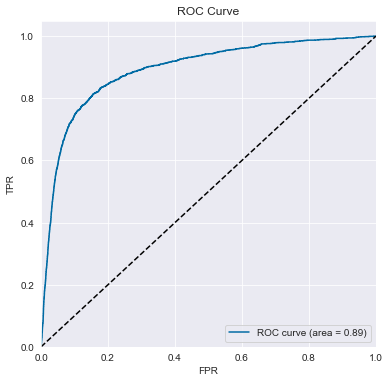

Optimal Cutoff:  [0.5280757423759584]
Accuracy(test):  0.8262 ||  Accuracy(train):  0.8357
Precision(test):  0.3455 ||  Precision(train):  0.8282
Recall(test):  0.8261 ||  Recall(train):  0.8469
F1(test) :  0.4872 ||  F1(train) :  0.8375
AUC(test):  0.8919 ||  AUC(train):  0.9058
Wall time: 15.2 s


In [45]:
%%time
lr_best1, lr_best1_cutoff = model_iterations(mdl = lr, n_iter = 20, Xtrain = X_train_pca_sm , ytrain = y_train_pca_sm, Xtest = X_test_pca , ytest = y_test)

### Logistic: with PCA, no SMOTE

Fitting 4 folds for each of 20 candidates, totalling 80 fits
Best score from Grid: 
 0.9183044480099166
Best estimator from grid: 
 LogisticRegression(C=2)


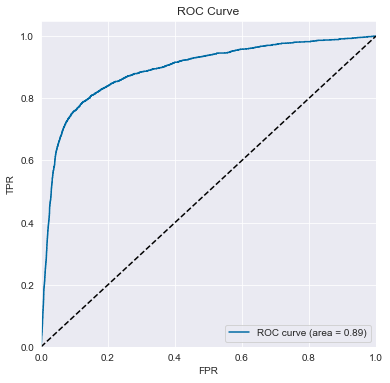

Optimal Cutoff:  [0.11860552353695858]
Accuracy(test):  0.8247 ||  Accuracy(train):  0.821
Precision(test):  0.3432 ||  Precision(train):  0.3444
Recall(test):  0.8247 ||  Recall(train):  0.8222
F1(test) :  0.4847 ||  F1(train) :  0.4855
AUC(test):  0.8927 ||  AUC(train):  0.8929
Wall time: 6.44 s


In [46]:
%%time
lr_best2, lr_best2_cutoff = model_iterations(mdl = lr, n_iter = 20, Xtrain = X_train_pca ,ytrain = y_train, Xtest = X_test_pca ,ytest = y_test)

### Logistic: no PCA, with SMOTE

Fitting 4 folds for each of 20 candidates, totalling 80 fits
Best score from Grid: 
 0.838272756220716
Best estimator from grid: 
 LogisticRegression(C=0.4)


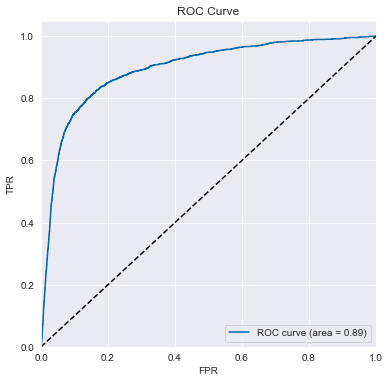

Optimal Cutoff:  [0.5198291764476679]
Accuracy(test):  0.8289 ||  Accuracy(train):  0.8401
Precision(test):  0.3497 ||  Precision(train):  0.8311
Recall(test):  0.8285 ||  Recall(train):  0.8537
F1(test) :  0.4918 ||  F1(train) :  0.8423
AUC(test):  0.8945 ||  AUC(train):  0.9102
Wall time: 1min 19s


In [47]:
%%time
lr_best3, lr_best3_cutoff = model_iterations(mdl = lr, n_iter = 20, Xtrain = X_train_sm ,ytrain = y_train_sm, Xtest = X_test ,ytest = y_test)

### Logistic: no PCA, no SMOTE

Fitting 4 folds for each of 20 candidates, totalling 80 fits
Best score from Grid: 
 0.922610668759299
Best estimator from grid: 
 LogisticRegression(C=15)


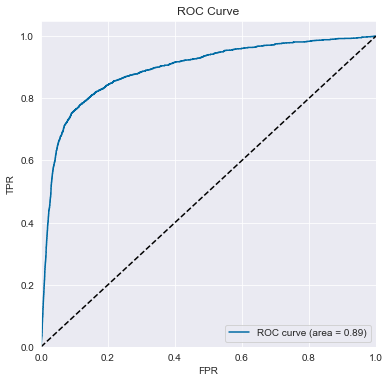

Optimal Cutoff:  [0.1130742735401733]
Accuracy(test):  0.8261 ||  Accuracy(train):  0.8229
Precision(test):  0.3454 ||  Precision(train):  0.3476
Recall(test):  0.8261 ||  Recall(train):  0.8259
F1(test) :  0.4871 ||  F1(train) :  0.4893
AUC(test):  0.8943 ||  AUC(train):  0.897
Wall time: 30.2 s


In [48]:
%%time
lr_best4, lr_best4_cutoff = model_iterations(mdl = lr, n_iter = 20, Xtrain = X_train ,ytrain = y_train, Xtest = X_test ,ytest = y_test)

#### overall, amongst the logistic regression models, only lr4 seems to be better. It has decent accuracy validation score as well as not overfit. will use this as one candidate model for submission

## Decision Trees iterations

In [49]:
#instance
dtr = DecisionTreeClassifier(random_state=random_state)

#params
params = { 
    'max_depth': [2, 3, 5,7, 10, 12,15, 20],
    'min_samples_leaf': [5, 10, 20, 50, 100],
    'min_samples_split':[25, 50,75, 100,200,300,400,500],
    'criterion': ["gini", "entropy"]
        }

### DTree: with PCA, with SMOTE

Fitting 4 folds for each of 20 candidates, totalling 80 fits
Best score from Grid: 
 0.8605854523950325
Best estimator from grid: 
 DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=10,
                       min_samples_split=50, random_state=100)


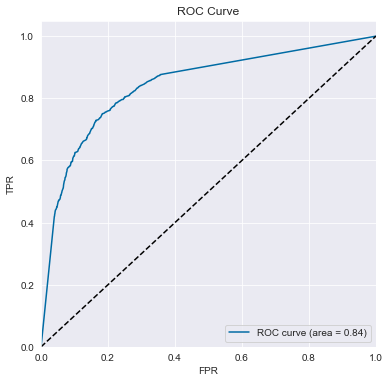

Optimal Cutoff:  [0.30434782608695654]
Accuracy(test):  0.7806 ||  Accuracy(train):  0.9043
Precision(test):  0.2824 ||  Precision(train):  0.8554
Recall(test):  0.7751 ||  Recall(train):  0.9732
F1(test) :  0.4139 ||  F1(train) :  0.9105
AUC(test):  0.8423 ||  AUC(train):  0.9806
Wall time: 2min 4s


In [50]:
%%time
dtr_best1, dtr_best1_cutoff = model_iterations(mdl = dtr, n_iter = 20, Xtrain = X_train_pca_sm , ytrain = y_train_pca_sm, Xtest = X_test_pca , ytest = y_test)

### DTree: with PCA, no SMOTE

Fitting 4 folds for each of 20 candidates, totalling 80 fits
Best score from Grid: 
 0.9185289827907651
Best estimator from grid: 
 DecisionTreeClassifier(max_depth=10, min_samples_leaf=50, min_samples_split=300,
                       random_state=100)


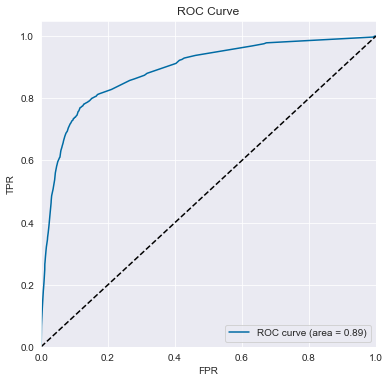

Optimal Cutoff:  [0.044642857142857144]
Accuracy(test):  0.8272 ||  Accuracy(train):  0.8307
Precision(test):  0.3453 ||  Precision(train):  0.3623
Recall(test):  0.8132 ||  Recall(train):  0.8522
F1(test) :  0.4847 ||  F1(train) :  0.5084
AUC(test):  0.8894 ||  AUC(train):  0.9063
Wall time: 1min 4s


In [51]:
%%time
dtr_best2, dtr_best2_cutoff = model_iterations(mdl = dtr, n_iter = 20, Xtrain = X_train_pca ,ytrain = y_train, Xtest = X_test_pca ,ytest = y_test)

### DTree: no PCA, with SMOTE

Fitting 4 folds for each of 20 candidates, totalling 80 fits
Best score from Grid: 
 0.9048469271709958
Best estimator from grid: 
 DecisionTreeClassifier(criterion='entropy', max_depth=20, min_samples_leaf=10,
                       min_samples_split=50, random_state=100)


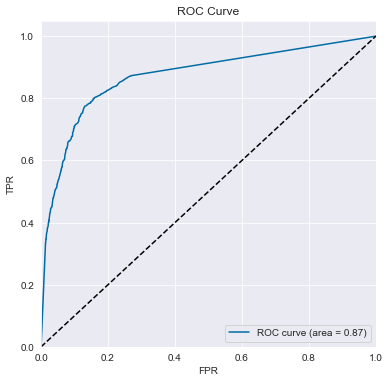

Optimal Cutoff:  [0.16666666666666666]
Accuracy(test):  0.8194 ||  Accuracy(train):  0.9198
Precision(test):  0.3342 ||  Precision(train):  0.8678
Recall(test):  0.8137 ||  Recall(train):  0.9906
F1(test) :  0.4739 ||  F1(train) :  0.9251
AUC(test):  0.8714 ||  AUC(train):  0.9908
Wall time: 1min 45s


In [52]:
%%time
dtr_best3,dtr_best3_cutoff = model_iterations(mdl = dtr, n_iter = 20, Xtrain = X_train_sm ,ytrain = y_train_sm, Xtest = X_test ,ytest = y_test)

### DTree: no PCA, no SMOTE

Fitting 4 folds for each of 20 candidates, totalling 80 fits
Best score from Grid: 
 0.9413253743329318
Best estimator from grid: 
 DecisionTreeClassifier(max_depth=12, min_samples_leaf=100,
                       min_samples_split=500, random_state=100)


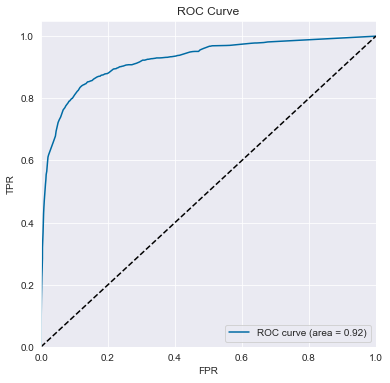

Optimal Cutoff:  [0.09583333333333334]
Accuracy(test):  0.8604 ||  Accuracy(train):  0.8642
Precision(test):  0.4057 ||  Precision(train):  0.4221
Recall(test):  0.8528 ||  Recall(train):  0.8726
F1(test) :  0.5498 ||  F1(train) :  0.5689
AUC(test):  0.923 ||  AUC(train):  0.9457
Wall time: 50.2 s


In [53]:
%%time
dtr_best4, dtr_best4_cutoff = model_iterations(mdl = dtr, n_iter = 20, Xtrain = X_train ,ytrain = y_train, Xtest = X_test ,ytest = y_test)

#### overall, amongst the decision tree models, only dtr4 seems to be better. It has decent accuracy validation score as well as not overfit. will use this as one candidate model for submission

## Random Forest iterations

In [54]:
#RF instance
rf = RandomForestClassifier(random_state=random_state, n_jobs = -1)

#params grid
params = {
     'bootstrap': [True, False],
     'max_depth': [2,3,5,7,10,12,15,20],
     'max_features': ['auto', 'sqrt'],
     'min_samples_leaf': [5,10,15,20,25,50,100],
     'min_samples_split': [10,20,50,100,200, 300, 400, 500],
     'n_estimators': [10,25, 50, 100,150, 200,300,400,500]
}

### RF: with PCA + with SMOTE

Fitting 4 folds for each of 2 candidates, totalling 8 fits
Best score from Grid: 
 0.8784174134558522
Best estimator from grid: 
 RandomForestClassifier(max_depth=12, max_features='sqrt', min_samples_leaf=10,
                       min_samples_split=50, n_estimators=300, n_jobs=-1,
                       random_state=100)


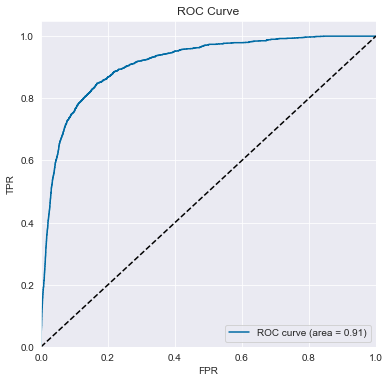

Optimal Cutoff:  [0.3956391539146453]
Accuracy(test):  0.8384 ||  Accuracy(train):  0.9002
Precision(test):  0.3655 ||  Precision(train):  0.8685
Recall(test):  0.838 ||  Recall(train):  0.9433
F1(test) :  0.509 ||  F1(train) :  0.9043
AUC(test):  0.9134 ||  AUC(train):  0.9658
Wall time: 25min 27s


In [55]:
%%time
rf_best1, rf_best1_cutoff = model_iterations(mdl = rf, n_iter = 2, Xtrain = X_train_pca_sm ,ytrain = y_train_pca_sm,Xtest = X_test_pca ,ytest = y_test)

### RF : with PCA, no SMOTE

Fitting 4 folds for each of 2 candidates, totalling 8 fits
Best score from Grid: 
 0.9173248261832285
Best estimator from grid: 
 RandomForestClassifier(max_depth=12, max_features='sqrt', min_samples_leaf=10,
                       min_samples_split=50, n_estimators=300, n_jobs=-1,
                       random_state=100)


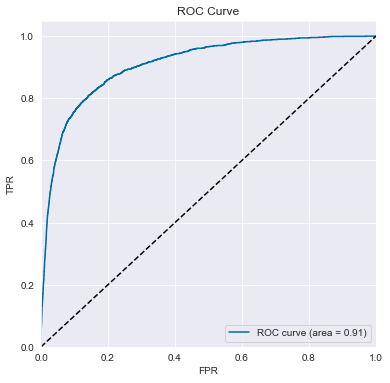

Optimal Cutoff:  [0.10094460584006637]
Accuracy(test):  0.8322 ||  Accuracy(train):  0.8518
Precision(test):  0.3551 ||  Precision(train):  0.4025
Recall(test):  0.8318 ||  Recall(train):  0.9132
F1(test) :  0.4977 ||  F1(train) :  0.5587
AUC(test):  0.9095 ||  AUC(train):  0.9526
Wall time: 5min 18s


In [56]:
%%time
rf_best2, rf_best2_cutoff = model_iterations(mdl = rf, n_iter = 2, Xtrain = X_train_pca ,ytrain = y_train, Xtest = X_test_pca ,ytest = y_test)

### RF : no PCA, with SMOTE

Fitting 4 folds for each of 2 candidates, totalling 8 fits
Best score from Grid: 
 0.9099986353091024
Best estimator from grid: 
 RandomForestClassifier(max_depth=12, max_features='sqrt', min_samples_leaf=10,
                       min_samples_split=50, n_estimators=300, n_jobs=-1,
                       random_state=100)


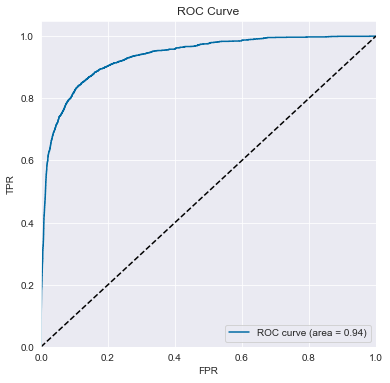

Optimal Cutoff:  [0.32229458466172645]
Accuracy(test):  0.8624 ||  Accuracy(train):  0.9292
Precision(test):  0.4104 ||  Precision(train):  0.89
Recall(test):  0.8623 ||  Recall(train):  0.9795
F1(test) :  0.5562 ||  F1(train) :  0.9326
AUC(test):  0.9359 ||  AUC(train):  0.9809
Wall time: 4min 20s


In [57]:
%%time
rf_best3, rf_best3_cutoff = model_iterations(mdl = rf, n_iter = 2, Xtrain = X_train_sm ,ytrain = y_train_sm, Xtest = X_test ,ytest = y_test)

### RF: no PCA, no SMOTE

Fitting 4 folds for each of 2 candidates, totalling 8 fits
Best score from Grid: 
 0.9412845613386183
Best estimator from grid: 
 RandomForestClassifier(max_depth=12, max_features='sqrt', min_samples_leaf=10,
                       min_samples_split=50, n_estimators=300, n_jobs=-1,
                       random_state=100)


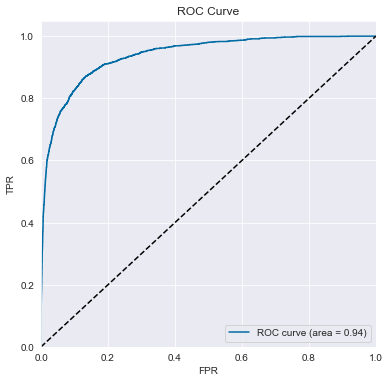

Optimal Cutoff:  [0.08431736416209043]
Accuracy(test):  0.8683 ||  Accuracy(train):  0.8836
Precision(test):  0.4227 ||  Precision(train):  0.4672
Recall(test):  0.868 ||  Recall(train):  0.9454
F1(test) :  0.5686 ||  F1(train) :  0.6253
AUC(test):  0.9399 ||  AUC(train):  0.971
Wall time: 1min 57s


In [58]:
%%time
rf_best4, rf_best4_cutoff = model_iterations(mdl = rf, n_iter = 2, Xtrain = X_train ,ytrain = y_train, Xtest = X_test ,ytest = y_test)

#### overall, amongst the randomforest models, rf4 seems to be better. It has decent accuracy validation score as well as not overfit. will use this as one candidate model for submission

## XGB iterations

In [59]:
#instance
xgb = xgb.XGBClassifier(n_jobs = -1,objective = 'binary:logistic')

#params
params = {
        'n_estimators' : [10, 20, 25, 50, 75, 100, 200, 300, 400, 500], # no of trees 
        'learning_rate' : [0.01, 0.02, 0.05, 0.1, 0.25],  # eta
        'min_child_weight': [1, 5, 7, 10],
        'gamma': [0.1, 0.25, 0.5, 0.75, 1, 1.25, 1.5, 2, 3, 5],
        'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],
        'colsample_bytree': [0.6, 0.7, 0.8, 0.9, 1.0],
        'max_depth': [2, 3, 4, 5, 6, 7, 8, 10, 12, 15]
        }


### XGB: with PCA + with SMOTE

Fitting 4 folds for each of 5 candidates, totalling 20 fits
[14:14:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Best score from Grid: 
 0.9587749624710002
Best estimator from grid: 
 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.9,
              enable_categorical=False, gamma=0.75, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.25, max_delta_step=0, max_depth=12,
              min_child_weight=10, missing=nan, monotone_constraints='()',
              n_estimators=500, n_jobs=-1, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_wei

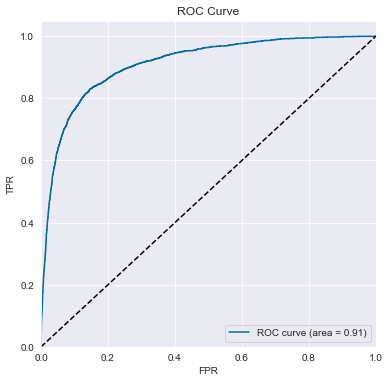

Optimal Cutoff:  [0.048455458134412766]
Accuracy(test):  0.8392 ||  Accuracy(train):  0.9755
Precision(test):  0.367 ||  Precision(train):  0.9534
Recall(test):  0.839 ||  Recall(train):  1.0
F1(test) :  0.5106 ||  F1(train) :  0.9761
AUC(test):  0.9109 ||  AUC(train):  1.0
Wall time: 41min 1s


In [60]:
%%time
xgb_best1, xgb_best1_cutoff = model_iterations(mdl = xgb, n_iter = 5, Xtrain = X_train_pca_sm ,ytrain = y_train_pca_sm,Xtest = X_test_pca ,ytest = y_test)

### XGB: with PCA + no SMOTE

Fitting 4 folds for each of 5 candidates, totalling 20 fits
[16:05:19] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Best score from Grid: 
 0.9277536358653184
Best estimator from grid: 
 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8,
              enable_categorical=False, gamma=1.25, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.02, max_delta_step=0, max_depth=12,
              min_child_weight=10, missing=nan, monotone_constraints='()',
              n_estimators=500, n_jobs=-1, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_wei

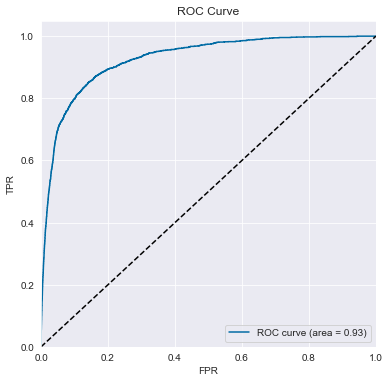

Optimal Cutoff:  [0.06728280335664749]
Accuracy(test):  0.8538 ||  Accuracy(train):  0.895
Precision(test):  0.3934 ||  Precision(train):  0.4945
Recall(test):  0.8537 ||  Recall(train):  0.9964
F1(test) :  0.5386 ||  F1(train) :  0.661
AUC(test):  0.9265 ||  AUC(train):  0.9963
Wall time: 1h 9min 8s


In [62]:
%%time
xgb_best2, xgb_best2_cutoff = model_iterations(mdl = xgb, n_iter = 5, Xtrain = X_train_pca ,ytrain = y_train, Xtest = X_test_pca ,ytest = y_test)

### XGB: no PCA, with SMOTE

Fitting 4 folds for each of 5 candidates, totalling 20 fits
[17:02:47] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Best score from Grid: 
 0.9456511850065961
Best estimator from grid: 
 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.6,
              enable_categorical=False, gamma=1.25, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=2,
              min_child_weight=5, missing=nan, monotone_constraints='()',
              n_estimators=300, n_jobs=-1, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_weight

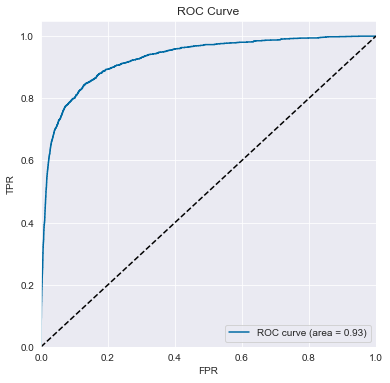

Optimal Cutoff:  [0.18035002052783966]
Accuracy(test):  0.854 ||  Accuracy(train):  0.9166
Precision(test):  0.3937 ||  Precision(train):  0.8674
Recall(test):  0.8537 ||  Recall(train):  0.9836
F1(test) :  0.5389 ||  F1(train) :  0.9218
AUC(test):  0.9292 ||  AUC(train):  0.9887
Wall time: 35min 37s


In [63]:
%%time
xgb_best3, xgb_best3_cutoff = model_iterations(mdl = xgb, n_iter = 5, Xtrain = X_train_sm ,ytrain = y_train_sm, Xtest = X_test ,ytest = y_test)

### XGB: no PCA, no SMOTE

Fitting 4 folds for each of 5 candidates, totalling 20 fits
[17:19:53] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Best score from Grid: 
 0.9419784605490493
Best estimator from grid: 
 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8,
              enable_categorical=False, gamma=1.25, gpu_id=-1,
              importance_type=None, interaction_constraints='',
              learning_rate=0.02, max_delta_step=0, max_depth=12,
              min_child_weight=10, missing=nan, monotone_constraints='()',
              n_estimators=500, n_jobs=-1, num_parallel_tree=1,
              predictor='auto', random_state=0, reg_alpha=0, reg_lambda=1,
              scale_pos_wei

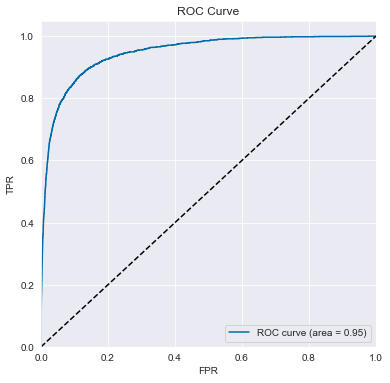

Optimal Cutoff:  [0.06322834640741348]
Accuracy(test):  0.8776 ||  Accuracy(train):  0.9091
Precision(test):  0.4433 ||  Precision(train):  0.5307
Recall(test):  0.8776 ||  Recall(train):  0.9966
F1(test) :  0.5891 ||  F1(train) :  0.6926
AUC(test):  0.9471 ||  AUC(train):  0.9953
Wall time: 20min 31s


In [64]:
%%time
xgb_best4, xgb_best4_cutoff = model_iterations(mdl = xgb, n_iter = 5, Xtrain = X_train ,ytrain = y_train, Xtest = X_test ,ytest = y_test)

#### Amongst the Xgboost models, xgb1, xgb3,xgb4 seems to be ok with xgb3,4 looking the strongest. They decent accuracy validation score as well as not overfit. will use these as candidate models for submission

## SVM

In [ ]:
#instance
svm = SVC(C=1, kernel = 'linear')

#params
params = { 
            'C':[0.1,0.2,0.3,0.4,0.5,1,2,3,4,5,10,50,100,500,1000],
            'kernel':['rbf','sigmoid','linear'], #'poly',
            'degree':[1,2,3,4,5,6],
            'gamma': ['auto',1, 0.1, 0.01, 0.001, 0.0001]
            }

#svmmodel = svm.fit(X_train_pca_sm,y_train_pca_sm)

### SVM with PCA, with SMOTE

In [ ]:
%%time
svm_best1 = model_iterations(mdl = svm, n_iter = 2, Xtrain = X_train_pca_sm , ytrain = y_train_pca_sm, Xtest = X_test_pca , ytest = y_test)

### SVM: with PCA, no SMOTE

In [ ]:
%%time
svm_best2 = model_iterations(mdl = svm, n_iter = 2, Xtrain = X_train_pca ,ytrain = y_train, Xtest = X_test_pca ,ytest = y_test)

### SVM: no PCA, with SMOTE

In [ ]:
%%time
svm_best3 = model_iterations(mdl = svm, n_iter = 2, Xtrain = X_train_sm ,ytrain = y_train_sm, Xtest = X_test ,ytest = y_test)

### SVM: no PCA, no SMOTE

In [ ]:
%%time
svm_best4 = model_iterations(mdl = svm, n_iter = 2, Xtrain = X_train ,ytrain = y_train, Xtest = X_test ,ytest = y_test)

### Best XGB model submission

In [68]:
#predictions
y_testcsv_pred_final = xgb_best4.predict(testcsv_df)

#create final dataframe
xgb4_submission = pd.DataFrame({'id':testcsv_df_id['id'] ,'churn_probability':y_testcsv_pred_final})

#export submission to csv
xgb4_submission.to_csv('xgb4_submission.csv', sep =',', index = False)
#submission score 0.94430

In [71]:
#predictions
y_testcsv_pred_final = xgb_best3.predict(testcsv_df)

#create final dataframe
xgb3_submission = pd.DataFrame({'id':testcsv_df_id['id'] ,'churn_probability':y_testcsv_pred_final})

#export submission to csv
xgb3_submission.to_csv('xgb3_submission.csv', sep =',', index = False)
#submission score 0.93600

In [70]:
#predictions
y_testcsv_pred_final = xgb_best1.predict(testcsv_df_pca)

#create final dataframe
xgb1_submission = pd.DataFrame({'id':testcsv_df_id['id'] ,'churn_probability':y_testcsv_pred_final})

#export submission to csv
xgb1_submission.to_csv('xgb1_submission.csv', sep =',', index = False)
#submission score 0.91163

### Best RF model submission

In [72]:
#predictions
y_testcsv_pred_final = rf_best4.predict(testcsv_df)

#create final dataframe
rf4_submission = pd.DataFrame({'id':testcsv_df_id['id'] ,'churn_probability':y_testcsv_pred_final})

#export submission to csv
rf4_submission.to_csv('rf4_submission.csv', sep =',', index = False)
#submission score 0.94413

### Best Decision tree model submission

In [75]:
#predictions
y_testcsv_pred_final = dtr_best4.predict(testcsv_df)

#create final dataframe
dtr4_submission = pd.DataFrame({'id':testcsv_df_id['id'] ,'churn_probability':y_testcsv_pred_final})

#export submission to csv
dtr4_submission.to_csv('dtr4_submission.csv', sep =',', index = False)
#submission score 0.94350

### Best Logistic regression model submission

In [74]:
#predictions
y_testcsv_pred_final = lr_best4.predict(testcsv_df)

#create final dataframe
lr4_submission = pd.DataFrame({'id':testcsv_df_id['id'] ,'churn_probability':y_testcsv_pred_final})

#export submission to csv
lr4_submission.to_csv('lr4_submission.csv', sep =',', index = False)
#submission score 0.89613

### Final model prediction submission scores from kaggle platform:
- **Xgb4 0.94430**
- Xgb3 0.93600
- Xgb1 0.91163
- Rf4 0.94413
- Dtr4 0.94350
- Lr4 0.89613

Note that across techniques, the best performance result comes up in the cases where there was no PCA done and no SMOTE used for imabalance. This counter intuitive as we expect PCA and SMOTE to signifincantly help in performance and speed of the model

## Model Interpreatations
To interpret the models, we will need to to use the actual train data ( no PCA, no SMOTE). This corresponds to the '4th' version of the model iterations above. So, in our journey of interpretations, we will explring the below models:

- Xgb_best4
 - rf_best4
 - dtr_best4
 
 Note: We know that there a lot of linear relationships between the variables. Interpretations from logistic regression will not be reliable . The performance of the logitic model was also evident. <br>
 
To interpret the models, we will use better(than logitic) techniques like variable importance and more advanced SHAP values.
- Variable importance gives us a relative weight of the 'importance' of that variable while building the model. This can be used to conclude the most important factors that are contributing to the perforance of the model
- For shap values, we will use two charts. One, is simialr the importance chart and the other is a Summary plot that tells us the direction of influence of a particualr feature. The summary plot will already shortlist the top factors absed on theri cumulative shap values score
 
 

In [101]:
#inputs: mdl, xtrain, top k
def variable_importances(mdl, X_train, k):

    fi = pd.DataFrame({'Variable': X_train.columns, 'Importance':mdl.feature_importances_})
    fi.sort_values(by ='Importance' , ascending =False, inplace=True)
    fi_k = fi[:k]
    #print(fi_k)    
    sns.barplot(data=fi_k, y ='Variable', x ='Importance')
    plt.title("Top k Variable importance for model " )
    
#shap
def model_shap_interpretation(mdl, X_train):
    explainer = shap.TreeExplainer(mdl)
    shap_values = explainer.shap_values(X_train)  
    shap.summary_plot(shap_values, X_train)
    shap.summary_plot(shap_values, X_train, plot_type = 'bar')   
    

### XGB model interpreations

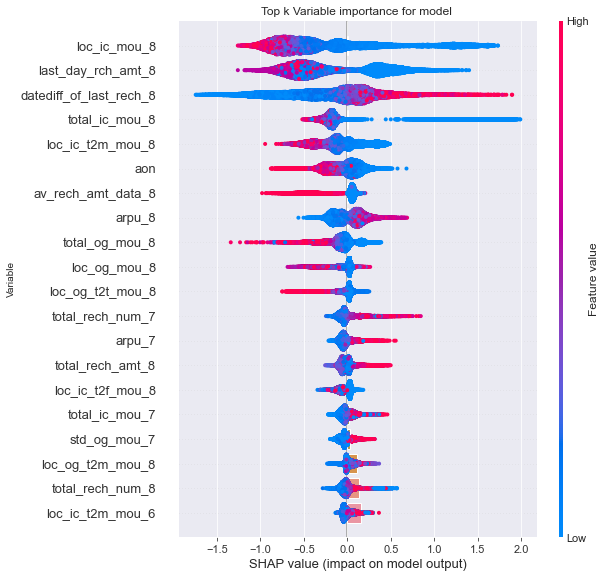

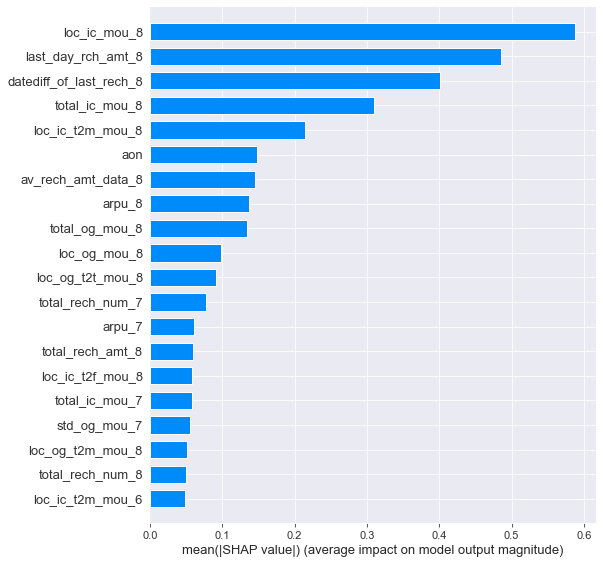

Wall time: 6min 29s


In [102]:
%%time
#var importance
variable_importances(mdl =  xgb_best4, X_train = X_train, k = 20)
#shap
model_shap_interpretation(mdl =  xgb_best4, X_train = X_train)

### Random Forest model interpretations

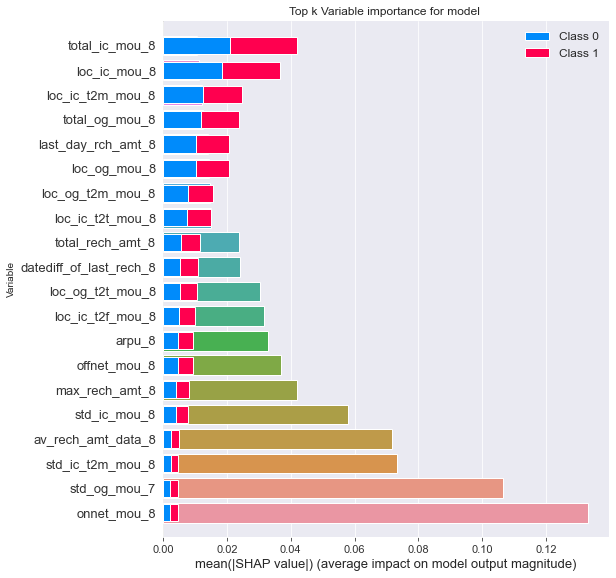

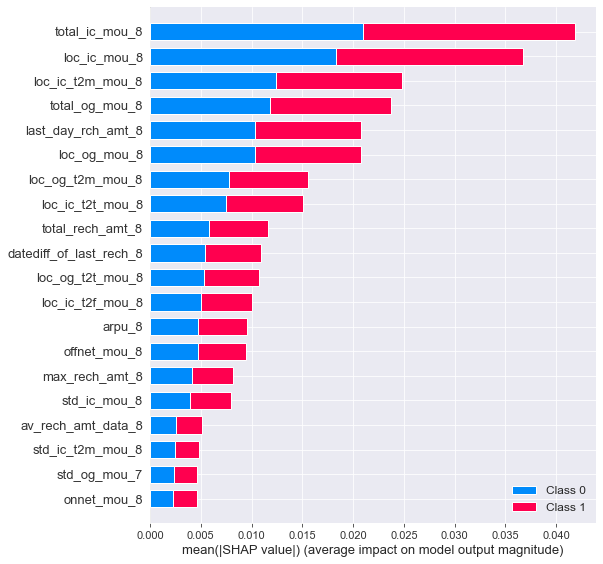

Wall time: 1h 2min 6s


In [103]:
%%time
#var importance
variable_importances(mdl =  rf_best4, X_train = X_train, k = 20) 
#shap
model_shap_interpretation(mdl =  rf_best4, X_train = X_train)

### Decision tree model interpretations

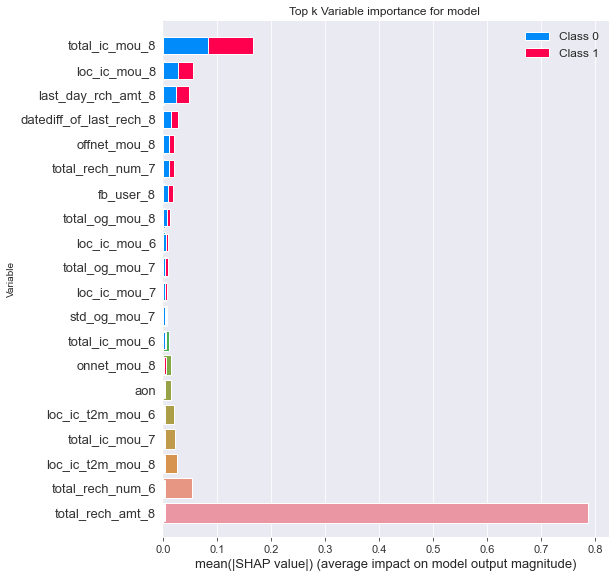

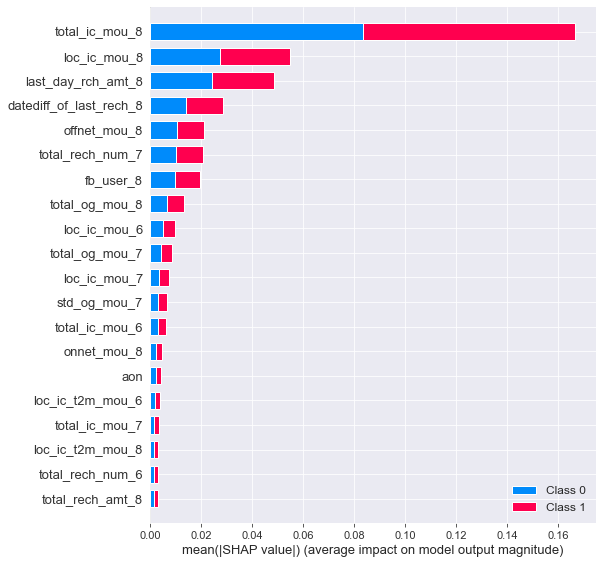

Wall time: 3.77 s


In [104]:
%%time
#var importance
variable_importances(mdl =  dtr_best4, X_train = X_train, k = 20)
#shap
model_shap_interpretation(mdl =  dtr_best4, X_train = X_train)

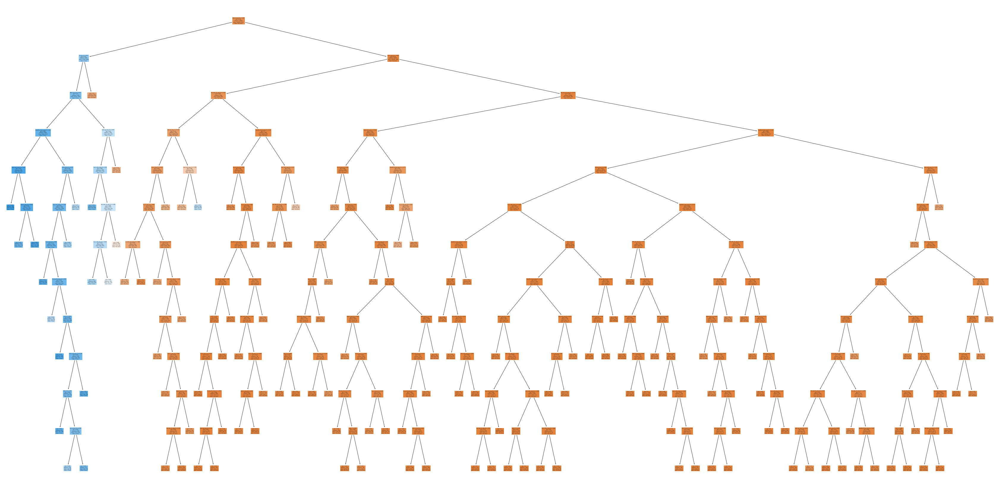

In [107]:
#plot tree
plt.figure(figsize=(60,30))
plot_tree(dtr_best4, feature_names = X_train.columns,class_names=['No Churn', "Churn"],filled=True);

# the best model is too deep

# 5. Final results/insights

Based on the model interpretations, we see there is a consistency in the variables that are coming up in the models as important. Below are the final list of variables that are having high impact to churn:
 - Consistently, the customer behaviour in the immeidate months is more relevant to churn in Septemeber. August and July kpis come up more significant
 - (loc_ic_mou_8 and tot_ic_mou_8) Higher the incoming calls minutes of usage in the most immediate months, lesser the churn and vice versa, lower the customer engagement with incoming calls, higher the chance of churn
 - (loc_og_mou_8 and tot_og_mou_8) Higher the outgoing calls minutes of usage in the most immediate months, lesser the churn and vice versa, lower the customer engagement with outgoing calls, higher the chance of churn
 - Last recharge amount in august( avegare, max) - higher the amount, lesser the chance of churn. Lower the recharge amount , higher the chance of churn
 - Last recharge date diff: If there is no recharge in the August month, then high chance of churn in the subsequent month
 - Age on network: Longer a customer has been with the company, more likely they are going to continue and less likely to churn
 - ARPU - ARPU in most recent months - higher the arpu, lower the churn
 
Recommendation:
- Engage with customer when there are to key triggers of non-usage from customer in the last month:
    - Use propensity score from the churn model and run campaign for top 3 deciles
    - Significant drop in Incoming calls from the last month
    - Significant drop in outgoing calls from the last month
    - Customer has missed their recharge
    - Customer is recharging significantly lesser amounts in last 2 months
 - The engagement can be in term of sales/marketing camapigns through SMSes, calls, App notifications and can act as nudges to the customers
 - Identify high value customers who have high  propensity(top 3 deciles) and arpu >75%percentile ARPU value (~360)
 - For imbalanced dataset classification problems, Accuracy should not be the metric of evaluation as it is not easy to interpret the value. Instead depending on the purpose for which the model is being used Precision(in cases where we need the model to be right mostly) or Recall(in cases where we need to capture a wider net and cover all actual target cases and miss little of them) is used. In a balanced case, F1 score can be used. Area under ROC curve is a robust metric which is independent of use case and can be used for model selection
 - For Sales & Marketing kind of campaigns, we are better using a F1 score or AUC, instead of Accuracy, Precision or Recall